# **Identifying identical images using token based fuzzy matching algorithm**

<img src="https://cdn.hipwallpaper.com/i/30/61/GSpBfq.jpg"> 

### *- Importing Libraries -*

In [2]:
import os
import cv2
import numpy as np
from PIL import Image
from matplotlib import pyplot as plt
from keras.preprocessing import image

### *- Convert pixels to categorical values -*

In [3]:
def conv_to_cat(n):
    if n<0.5:
        return 'a'
    elif 0.05 <= n < 0.15:
        return 'b'
    elif 0.15 <= n < 0.25:
        return 'c'
    elif 0.25 <= n < 0.35:
        return 'd'
    elif 0.35 <= n < 0.45:
        return 'e'
    elif 0.45 <= n < 0.55:
        return 'f'
    elif 0.55 <= n < 0.65:
        return 'g'
    elif 0.65 <= n < 0.75:
        return 'h'
    elif 0.75 <= n < 0.85:
        return 'i'
    elif 0.85 <= n < 0.95:
        return 'j'
    elif 0.95 <= n < 1:
        return 'k'
    else:
        return 'x'

## Jaccard Similarity 

- The Jaccard Index, also known as the Jaccard similarity coefficient OR Intersection over Union, is a statistic used to identify similarities between given sample sets.

### DESCRIPTION:

- Below function returns an approximate line similarity measure (between 0.0 and 1.0) using tokens (with default token size: q = 2). 


- Tokens are q-character sub-strings contained in a string. For example,

    'anshul' contains the tokens (q=2): ['an','ns','sh','hu','ul].


- Padding will result in specific tokens at the beginning and end of a string, for example 'anshul' converted into padded tokens (q=2) will result in the following token list: ['^a','an','ns','sh','hu','ul','l%'], with '^' illustrating the start and '%' the end character.


- This routine counts the number of common tokens and divides by the average/shortest/longest number of tokens. The resulting number is returned.

### *- Calculating Jaccard similarity -*

In [4]:
QGRAM_START_CHAR = chr(1)

QGRAM_END_CHAR =   chr(2)

def jaccard(str1, str2, q=2, common_divisor = 'longest', min_threshold = None,padded=False):
    if (str1 == '') or (str2 == '') or isinstance(str1, float) or isinstance(str2, float):
        return 0.0
    elif (str1 == str2):
        return 1.0
    
    # Calculate number of q-grams in strings (plus start and end characters) - -
    if (padded == True):
        num_qgram1 = len(str1)+q-1
        num_qgram2 = len(str2)+q-1
    else:
        num_qgram1 = max(len(str1)-(q-1),0)  # Make sure its not negative
        num_qgram2 = max(len(str2)-(q-1),0)
    
    # Check if there are q-grams at all from both strings - - - - - - - - - - - -
    # (no q-grams if length of a string is less than q)
    if ((padded == False) and (min(num_qgram1, num_qgram2) == 0)):
        return 0.0
    
    # Calculate the divisor - - - - - - - - - - - - - - - - - - - - - - - - - - -
    if (common_divisor == 'average'): # Average
        divisor = 0.5*(num_qgram1+num_qgram2) 
    elif (common_divisor == 'shortest'): # Shortest
        divisor = min(num_qgram1,num_qgram2)
    else:  # Longest
        divisor = max(num_qgram1,num_qgram2)
    
    # Use number of q-grams to quickly check for minimum threshold - - - - - - -
    if (min_threshold != None):
        if (isinstance(min_threshold, float)) and (min_threshold > 0.0) and \
           (min_threshold > 0.0):
            
            max_common_qgram = min(num_qgram1,num_qgram2)
            
            w = float(max_common_qgram) / float(divisor)
        
        if (w  < min_threshold):
            return 0.0  # Similariy is smaller than minimum threshold
    
    # Add start and end characters (padding) - - - - - - - - - - - - - - - - - -
    if (padded == True):
        qgram_str1 = (q-1)*QGRAM_START_CHAR+str1+(q-1)*QGRAM_END_CHAR
        qgram_str2 = (q-1)*QGRAM_START_CHAR+str2+(q-1)*QGRAM_END_CHAR
    else:
        qgram_str1 = str1
        qgram_str2 = str2
    
    # Make a list of q-grams for both strings - - - - - - - - - - - - - - - - - -
    qgram_list1 = [qgram_str1[i:i+q] for i in range(len(qgram_str1) - (q-1))]
    qgram_list2 = [qgram_str2[i:i+q] for i in range(len(qgram_str2) - (q-1))]
    
    # Get common q-grams  - - - - - - - - - - - - - - - - - - - - - - - - - - - -
    common = 0
    
    if (num_qgram1 < num_qgram2):  # Count using the shorter q-gram list
        short_qgram_list = qgram_list1
        long_qgram_list =  qgram_list2
    else:
        short_qgram_list = qgram_list2
        long_qgram_list =  qgram_list1
    
    for q_gram in short_qgram_list:
        if (q_gram in long_qgram_list):
            common += 1
            long_qgram_list.remove(q_gram)  # Remove the counted q-gram
    
    w = float(common) / float(divisor)
    
    assert (w >= 0.0) and (w <= 1.0), 'Similarity weight outside 0-1: %f' % (w)
    
    return w

### *- Image preprocessing and convert pixels to string -*


In [5]:
def img_to_str(path, size):
    img = image.load_img(path,target_size=(size,size,3))
    img = image.img_to_array(img)
    img = img/255
    img_to_arr = np.average(img,weights = [0.299,0.587,0.114],axis= 2)
    vec = np.vectorize(conv_to_cat)
    cat_arr = vec(img_to_arr)
    row_arr = [''.join(cat_arr[_,:]) for _ in range(img_to_arr.shape[0])]
    col_arr = [''.join(cat_arr[:,_]) for _ in range(img_to_arr.shape[1])]
    return row_arr + col_arr


### *- Create similarity index for both horizontal and vertical directions -*


In [6]:
def similarity_index(list1,list2,q):
    if len(list1) == len(list2):
        jaccard_dist = [jaccard(list1[i],list2[i],q) for i in range(len(list1))]
    else:
        jaccard_dist = []
    
    if len(jaccard_dist)>0:
        return round(sum(jaccard_dist)/len(jaccard_dist),4)
    else:
        return 0

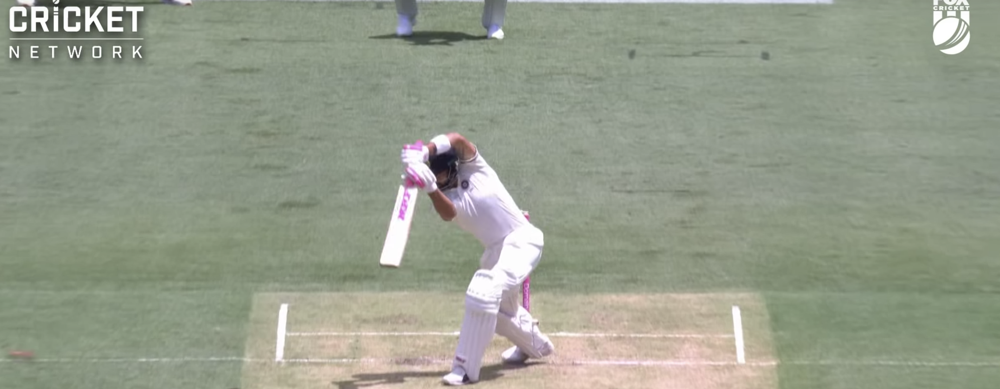

In [7]:
coverdrive1 = Image.open('/Users/anshulrankawat/Desktop/image_classification/black_and_white/kohli_coverdrive1.png')
coverdrive1

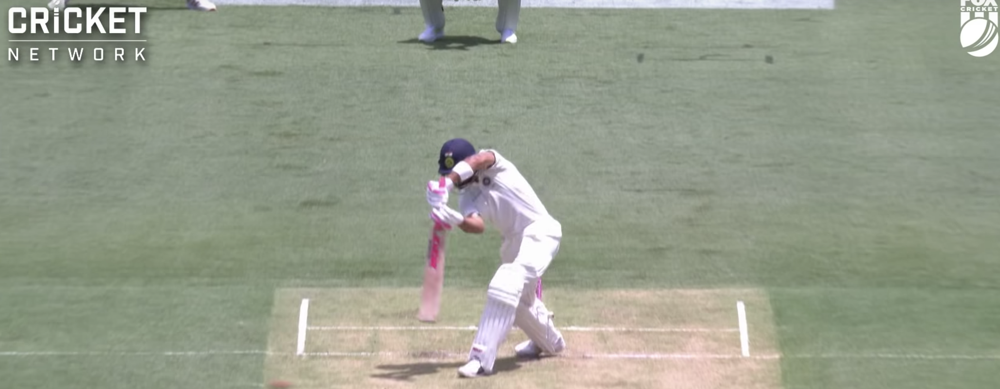

In [8]:
coverdrive2 = Image.open('/Users/anshulrankawat/Desktop/image_classification/black_and_white/kohli_coverdrive2.png')
coverdrive2

In [9]:
kohli1 = img_to_str('/Users/anshulrankawat/Desktop/image_classification/black_and_white/kohli_coverdrive1.png', 1000)
kohli2 = img_to_str('/Users/anshulrankawat/Desktop/image_classification/black_and_white/kohli_coverdrive2.png', 1000)

In [10]:
similarity_index(kohli1,kohli2,2)

0.9066

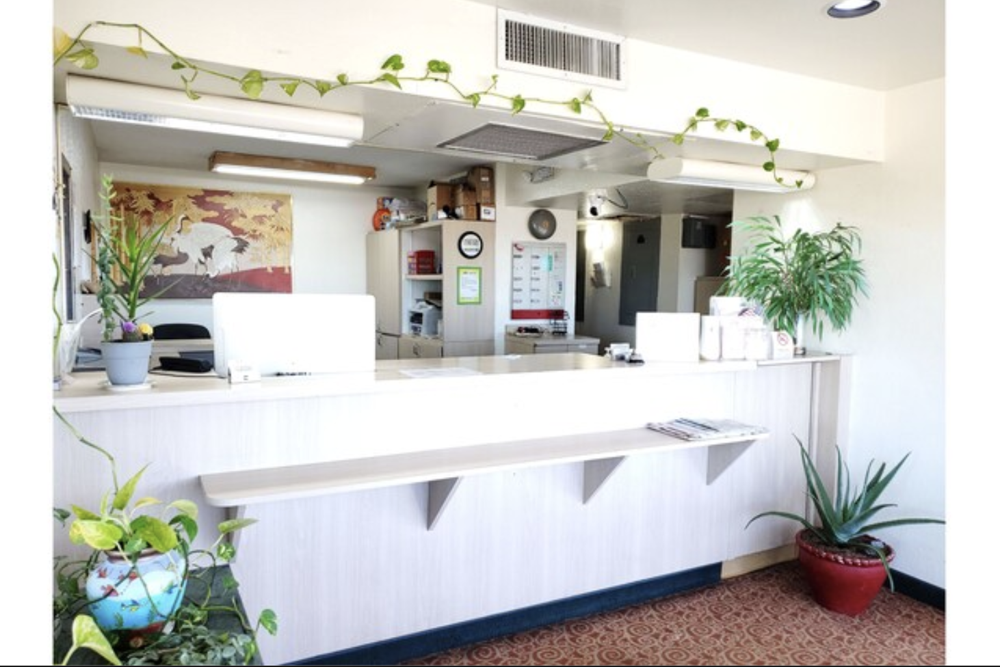

In [11]:
hotel1 = Image.open('/Users/anshulrankawat/Desktop/image_classification/images_v1/hotel1.png')
hotel1

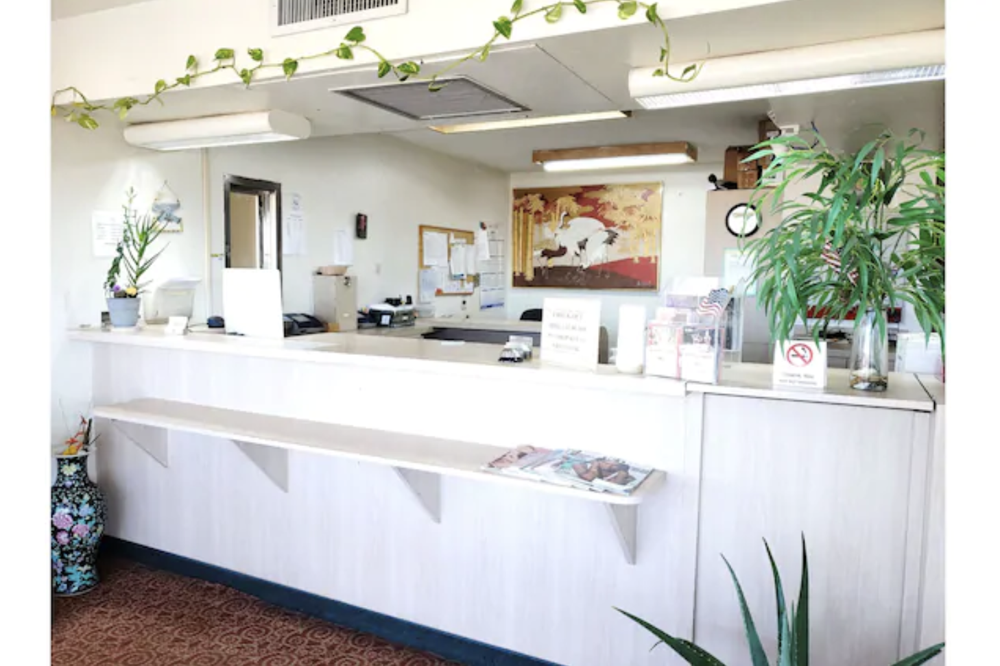

In [12]:
hotel2 = Image.open('/Users/anshulrankawat/Desktop/image_classification/images_v1/hotel2.png')
hotel2

In [13]:
hotel_1 = img_to_str('/Users/anshulrankawat/Desktop/image_classification/images_v1/hotel1.png', 1000)
hotel_2 = img_to_str('/Users/anshulrankawat/Desktop/image_classification/images_v1/hotel2.png', 1000)

In [14]:
similarity_index(hotel_1,hotel_2,2)

0.7471